# House prices prediction 

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import missingno as msno
from scipy import stats
import matplotlib.pyplot as plt
from scipy.stats import norm
import hvplot.pandas  
%matplotlib inline
 
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

## Loading dataset

In [2]:
df = pd.read_csv('/Users/edgarsicat/Documents/Data scientist Projects/House P/model/all_perth_310121.csv')
df

,ADDRESS,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,CBD_DIST,NEAREST_STN,NEAREST_STN_DIST,DATE_SOLD,POSTCODE,LATITUDE,LONGITUDE,NEAREST_SCH,NEAREST_SCH_DIST,NEAREST_SCH_RANK
0,1 Acorn Place,South Lake,565000,4,2,2.0,600,160,2003.0,18300,Cockburn Central Station,1800,09-2018\r,6164,-32.115900,115.842450,LAKELAND SENIOR HIGH SCHOOL,0.828339,NaN
1,1 Addis Way,Wandi,365000,3,2,2.0,351,139,2013.0,26900,Kwinana Station,4900,02-2019\r,6167,-32.193470,115.859554,ATWELL COLLEGE,5.524324,129.0
2,1 Ainsley Court,Camillo,287000,3,1,1.0,719,86,1979.0,22600,Challis Station,1900,06-2015\r,6111,-32.120578,115.993579,KELMSCOTT SENIOR HIGH SCHOOL,1.649178,113.0
3,1 Albert Street,Bellevue,255000,2,1,2.0,651,59,1953.0,17900,Midland Station,3600,07-2018\r,6056,-31.900547,116.038009,SWAN VIEW SENIOR HIGH SCHOOL,1.571401,NaN
4,1 Aman Place,Lockridge,325000,4,1,2.0,466,131,1998.0,11200,Bassendean Station,2000,11-2016\r,6054,-31.885790,115.947780,KIARA COLLEGE,1.514922,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33651,9C Gold Street,South Fremantle,1040000,4,3,2.0,292,245,2013.0,16100,Fremantle Station,1500,03-2016\r,6162,-32.064580,115.751820,CHRISTIAN BROTHERS' COLLEGE,1.430350,49.0
33652,9C Pycombe Way,Westminster,410000,3,2,2.0,228,114,NaN,9600,Stirling Station,4600,02-2017\r,6061,-31.867055,115.841403,JOHN SEPTIMUS ROE ANGLICAN COMMUNITY SCHOOL,1.679644,35.0
33653,9D Pycombe Way,Westminster,427000,3,2,2.0,261,112,NaN,9600,Stirling Station,4600,02-2017\r,6061,-31.866890,115.841418,JOHN SEPTIMUS ROE ANGLICAN COMMUNITY SCHOOL,1.669159,35.0
33654,9D Shalford Way,Girrawheen,295000,3,1,2.0,457,85,1974.0,12600,Warwick Station,4400,10-2016\r,6064,-31.839680,115.842410,GIRRAWHEEN SENIOR HIGH SCHOOL,0.358494,NaN


More than 10K dataset -> good size for our supervized model

## Data exploration on the dataset

As we aim to have interactive prediction we are dropping the unecessary columns 

In [3]:
df1 = df.drop([ 'ADDRESS', 'CBD_DIST', 'NEAREST_STN_DIST', 
               'DATE_SOLD', 'POSTCODE', 'NEAREST_SCH_DIST', 'NEAREST_SCH_RANK'], axis=1)

In [4]:
df1.PRICE.describe()

count    3.365600e+04
mean     6.370720e+05
std      3.558256e+05
min      5.100000e+04
25%      4.100000e+05
50%      5.355000e+05
75%      7.600000e+05
max      2.440000e+06
Name: PRICE, dtype: float64

/var/folders/g2/pf8chq_93fv3k45nyqlc096r0000gn/T/ipykernel_1926/3309348050.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df1['PRICE'])


<AxesSubplot: xlabel='PRICE', ylabel='Density'>

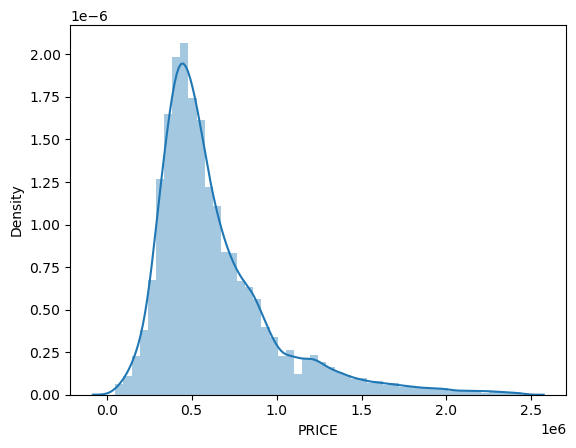

In [5]:
sns.distplot(df1['PRICE'])

In [6]:
print("Skewness: %f" % df1['PRICE'].skew())
print("Kurtosis: %f" % df1['PRICE'].kurt())

Skewness: 1.783086
Kurtosis: 3.969414


<AxesSubplot: >

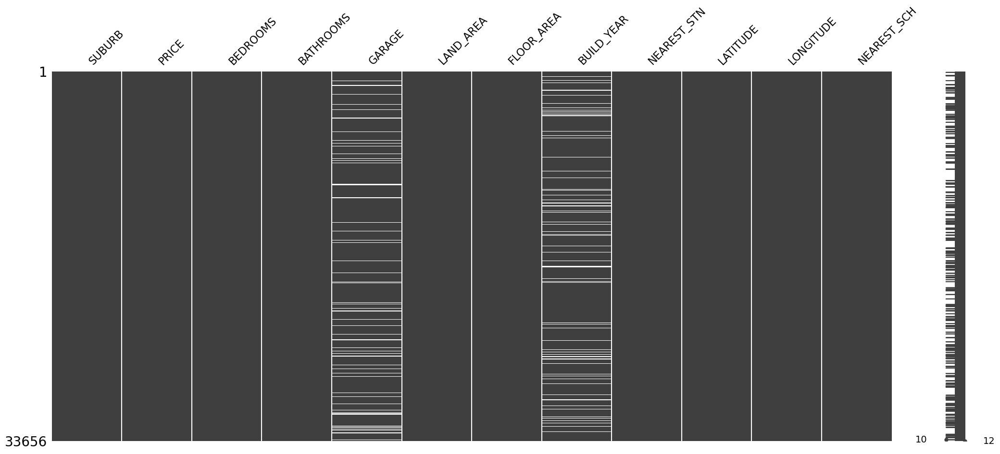

In [7]:
msno.matrix(df1)

In [8]:
#missing data
total = df1.isnull().sum().sort_values(ascending=False)
percent = (df1.isnull().sum()/df1.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
BUILD_YEAR,3155,0.093743
GARAGE,2478,0.073627
SUBURB,0,0.000000
PRICE,0,0.000000
BEDROOMS,0,0.000000
BATHROOMS,0,0.000000
LAND_AREA,0,0.000000
FLOOR_AREA,0,0.000000
NEAREST_STN,0,0.000000
LATITUDE,0,0.000000


In [9]:
df1['GARAGE'] = df1['GARAGE'].replace(np.nan, 0)

In [10]:
#missing data
total = df1.isnull().sum().sort_values(ascending=False)
percent = (df1.isnull().sum()/df1.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
BUILD_YEAR,3155,0.093743
SUBURB,0,0.000000
PRICE,0,0.000000
BEDROOMS,0,0.000000
BATHROOMS,0,0.000000
GARAGE,0,0.000000
LAND_AREA,0,0.000000
FLOOR_AREA,0,0.000000
NEAREST_STN,0,0.000000
LATITUDE,0,0.000000


In [11]:
df1 = df1.dropna()

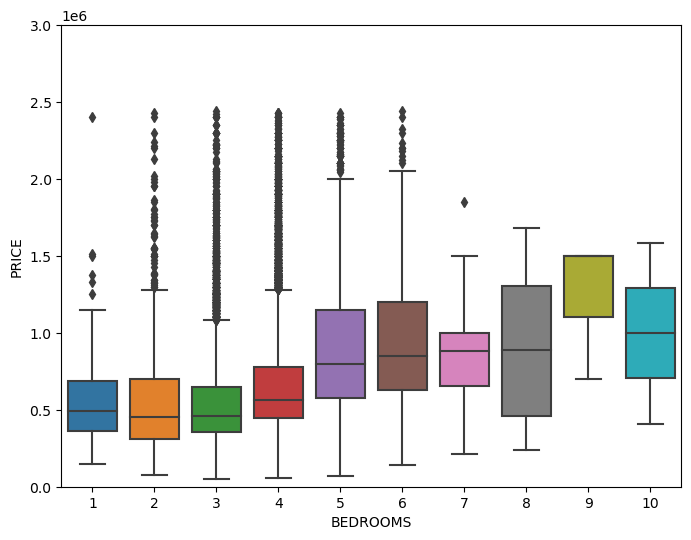

In [12]:
#box plot overallqual/saleprice
var = 'BEDROOMS'
data = pd.concat([df1['PRICE'], df1[var]], axis=1)
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x=var, y="PRICE", data=data)
fig.axis(ymin=0, ymax=3000000);

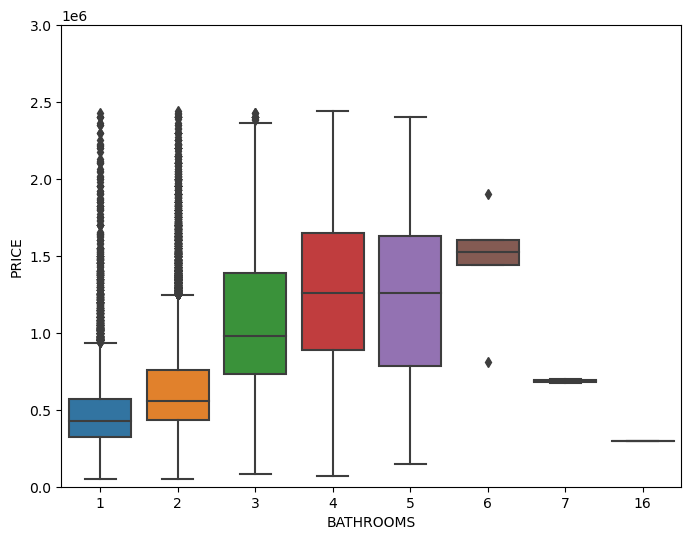

In [13]:
#box plot overallqual/saleprice
var = 'BATHROOMS'
data = pd.concat([df1['PRICE'], df1[var]], axis=1)
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x=var, y="PRICE", data=data)
fig.axis(ymin=0, ymax=3000000);

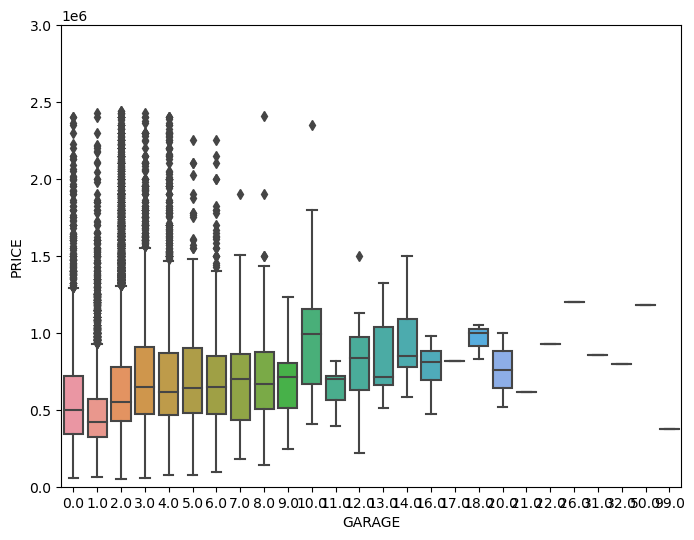

In [14]:
#box plot overallqual/saleprice
var = 'GARAGE'
data = pd.concat([df1['PRICE'], df1[var]], axis=1)
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x=var, y="PRICE", data=data)
fig.axis(ymin=0, ymax=3000000);

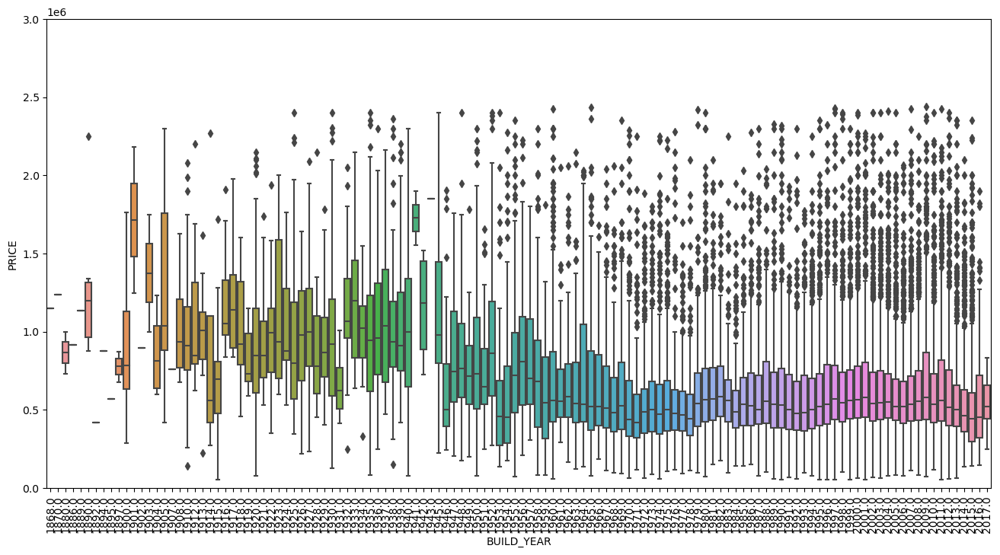

In [15]:
#box plot overallqual/saleprice
var = 'BUILD_YEAR'
data = pd.concat([df1['PRICE'], df1[var]], axis=1)
f, ax = plt.subplots(figsize=(16, 8))
fig = sns.boxplot(x=var, y="PRICE", data=data)
fig.axis(ymin=0, ymax=3000000);
plt.xticks(rotation=90);

/var/folders/g2/pf8chq_93fv3k45nyqlc096r0000gn/T/ipykernel_1926/269887028.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corrmat = df1.corr()


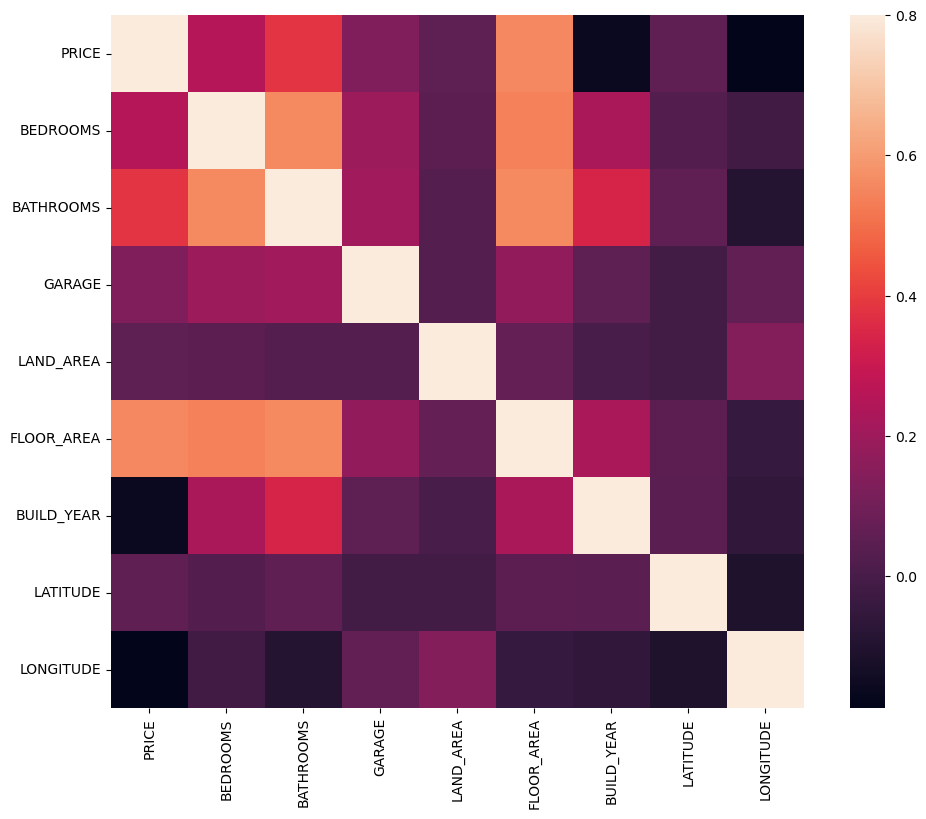

In [16]:
corrmat = df1.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, vmax=.8, square=True);

/var/folders/g2/pf8chq_93fv3k45nyqlc096r0000gn/T/ipykernel_1926/1607215782.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df1['PRICE'], fit=norm);


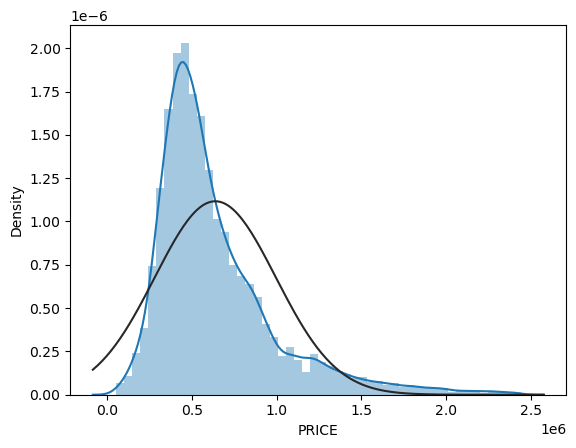

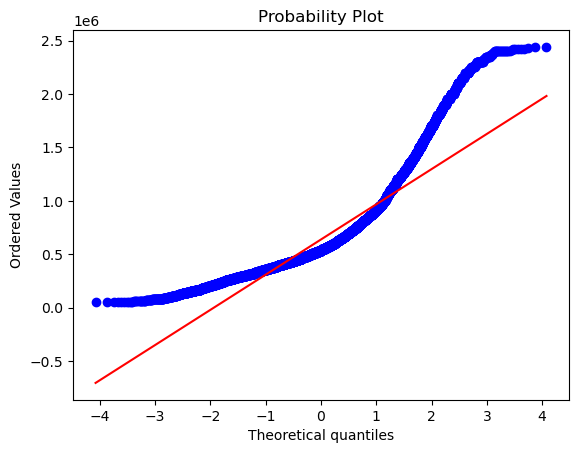

In [17]:
#histogram and normal probability plot
sns.distplot(df1['PRICE'], fit=norm);
fig = plt.figure()
res = stats.probplot(df1['PRICE'], plot=plt)

/var/folders/g2/pf8chq_93fv3k45nyqlc096r0000gn/T/ipykernel_1926/2687406782.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df1['PRICE_log'], fit=norm);


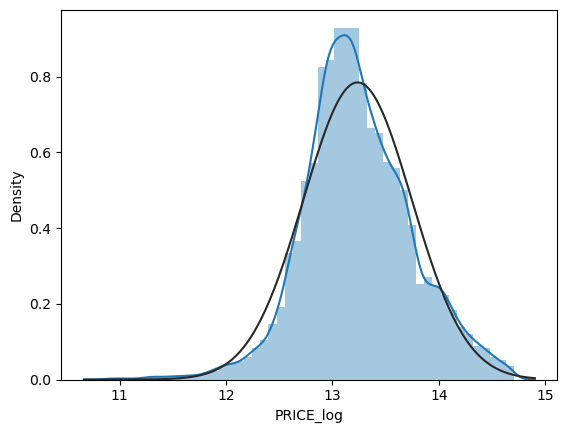

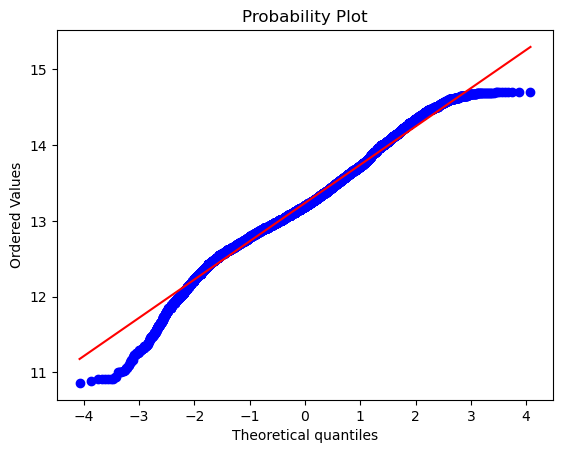

In [18]:
df1['PRICE_log'] = np.log(df1['PRICE'])

sns.distplot(df1['PRICE_log'], fit=norm);
fig = plt.figure()
res = stats.probplot(df1['PRICE_log'], plot=plt)

/var/folders/g2/pf8chq_93fv3k45nyqlc096r0000gn/T/ipykernel_1926/3782583951.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df1['BUILD_YEAR'], fit=norm)


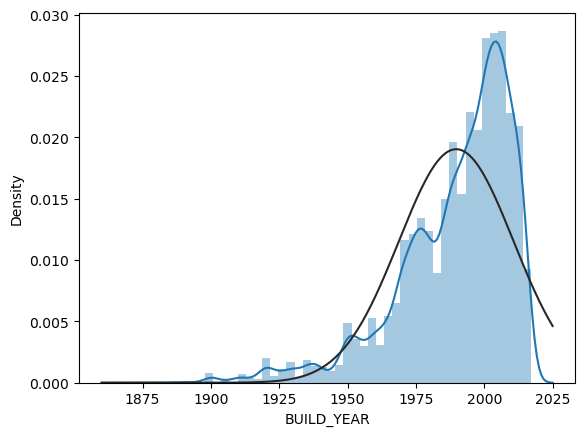

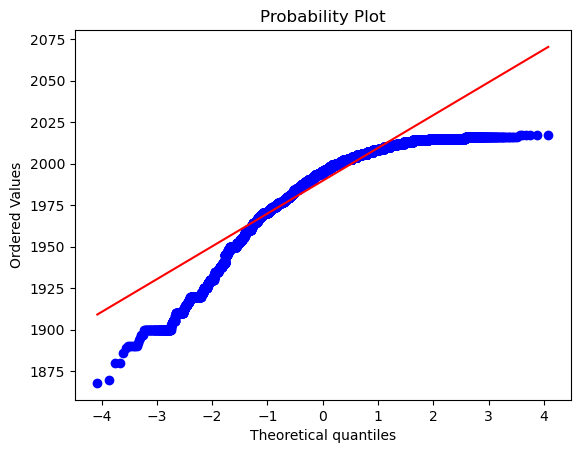

In [19]:
#histogram and normal probability plot
sns.distplot(df1['BUILD_YEAR'], fit=norm)
#plt.xlim(0, 15)
fig = plt.figure()
res = stats.probplot(df1['BUILD_YEAR'], plot=plt)

/var/folders/g2/pf8chq_93fv3k45nyqlc096r0000gn/T/ipykernel_1926/2188902948.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df1['BUILD_YEAR_log'], fit=norm);


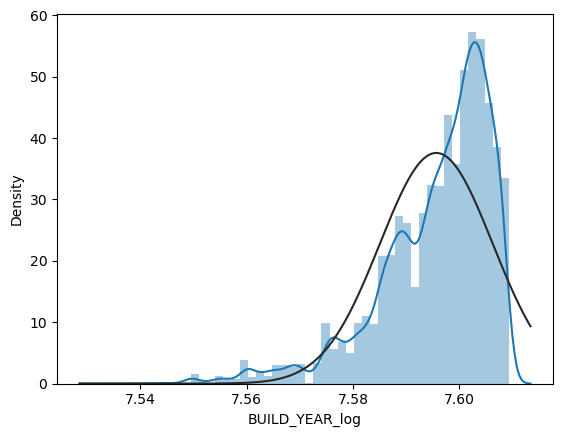

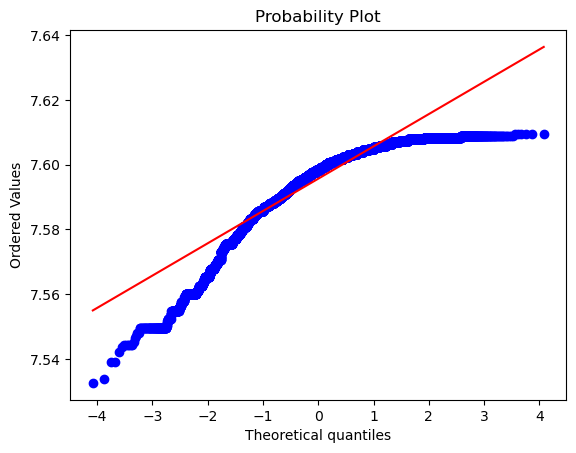

In [20]:
df1['BUILD_YEAR_log'] = np.log(df1['BUILD_YEAR'])

sns.distplot(df1['BUILD_YEAR_log'], fit=norm);
fig = plt.figure()
res = stats.probplot(df1['BUILD_YEAR_log'], plot=plt)

/var/folders/g2/pf8chq_93fv3k45nyqlc096r0000gn/T/ipykernel_1926/3163458983.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df1['FLOOR_AREA'], fit=norm);


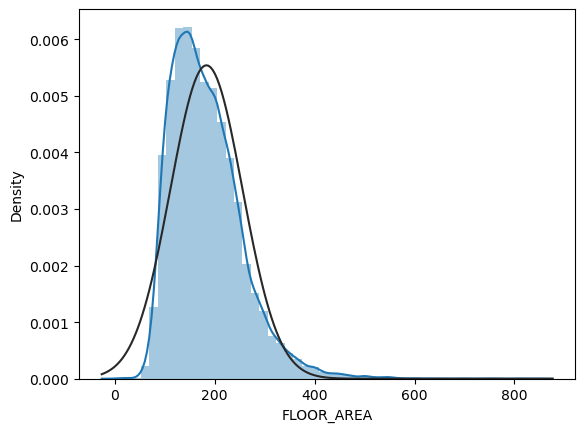

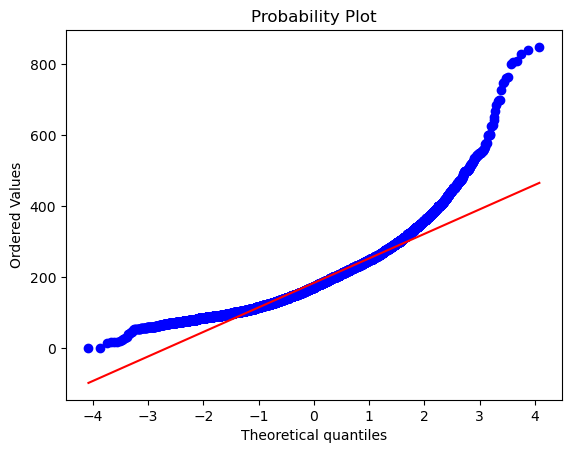

In [21]:
#histogram and normal probability plot
sns.distplot(df1['FLOOR_AREA'], fit=norm);
#plt.xlim(0, 5)
fig = plt.figure()
res = stats.probplot(df1['FLOOR_AREA'], plot=plt)

/var/folders/g2/pf8chq_93fv3k45nyqlc096r0000gn/T/ipykernel_1926/4290446189.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df1['FLOOR_AREA_log'], fit=norm);


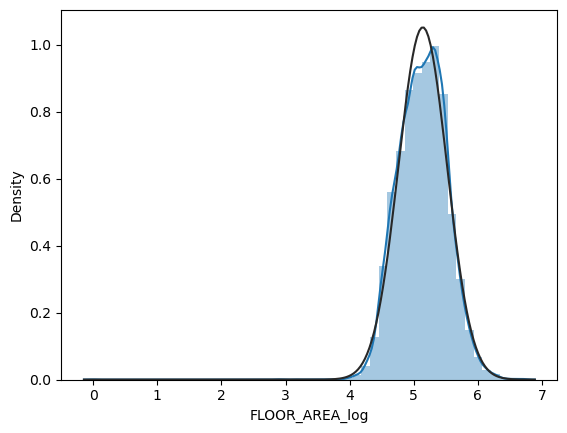

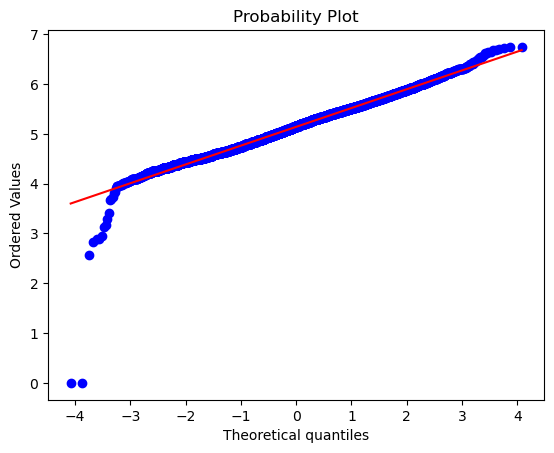

In [22]:
df1['FLOOR_AREA_log'] = np.log(df1['FLOOR_AREA'])

#histogram and normal probability plot
sns.distplot(df1['FLOOR_AREA_log'], fit=norm);
#plt.xlim(0, 5)
fig = plt.figure()
res = stats.probplot(df1['FLOOR_AREA_log'], plot=plt)

/var/folders/g2/pf8chq_93fv3k45nyqlc096r0000gn/T/ipykernel_1926/1590545915.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df1['LAND_AREA'], fit=norm);


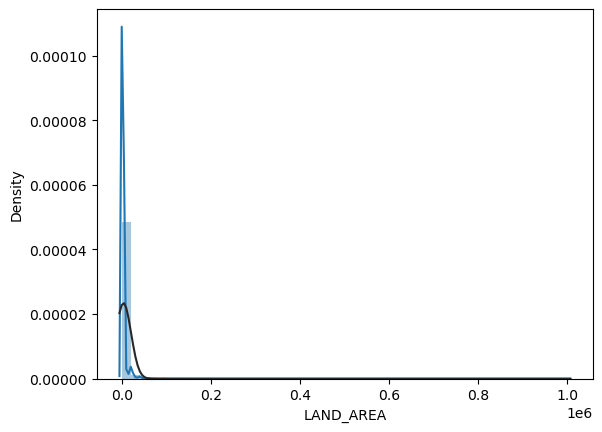

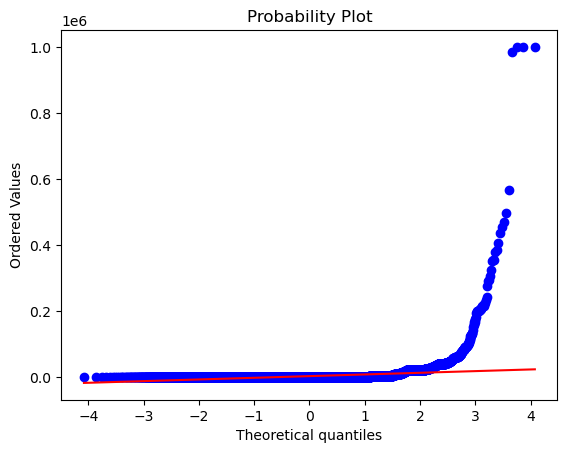

In [23]:
#histogram and normal probability plot
sns.distplot(df1['LAND_AREA'], fit=norm);
#plt.xlim(0, 5)
fig = plt.figure()
res = stats.probplot(df1['LAND_AREA'], plot=plt)

In [24]:
df1['LAND_AREA'].describe()

count     30501.000000
mean       2666.813744
std       17022.511689
min          61.000000
25%         505.000000
50%         683.000000
75%         835.000000
max      999999.000000
Name: LAND_AREA, dtype: float64

In [25]:
df1[df1['LAND_AREA'] > 50000]

,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,NEAREST_STN,LATITUDE,LONGITUDE,NEAREST_SCH,PRICE_log,BUILD_YEAR_log,FLOOR_AREA_log
360,Baskerville,1500000,3,1,1.0,54696,100,1974.0,Midland Station,-31.800523,116.012417,SWAN VALLEY ANGLICAN COMMUNITY SCHOOL,14.220976,7.587817,4.605170
431,Bickley,1000000,5,3,2.0,60024,236,1990.0,Madding,-32.002980,116.106730,CARMEL ADVENTIST COLLEGE,13.815511,7.595890,5.463832
1551,Darling Downs,249500,2,1,1.0,57820,60,1985.0,Armadale Station,-32.182946,115.975103,DALE CHRISTIAN SCHOOL,12.427214,7.593374,4.094345
1659,Mariginiup,140000,5,2,2.0,53758,536,2000.0,Currambine Station,-31.710770,115.819060,JOSEPH BANKS SECONDARY COLLEGE,11.849398,7.600902,6.284134
1824,Kwinana Beach,170000,3,1,2.0,92333,140,1970.0,Wellard Station,-32.246650,115.788600,GILMORE COLLEGE,12.043554,7.585789,4.941642
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30417,Bedfordale,985000,5,2,2.0,69794,238,1981.0,Armadale Station,-32.180730,116.086670,SOUTHERN HILLS CHRISTIAN COLLEGE,13.800397,7.591357,5.472271
31852,Gidgegannup,1250000,5,2,0.0,200188,438,2006.0,Midland Station,-31.724958,116.189463,EASTERN HILLS SENIOR HIGH SCHOOL,14.038654,7.603898,6.082219
33188,Herne Hill,1240000,4,2,2.0,85409,220,1985.0,Midland Station,-31.827900,116.035080,SWAN CHRISTIAN COLLEGE,14.030622,7.593374,5.393628
33450,Mariginiup,295000,4,2,2.0,70133,173,1997.0,Currambine Station,-31.702955,115.862260,JOSEPH BANKS SECONDARY COLLEGE,12.594731,7.599401,5.153292


In [26]:
df1 = df1[~(df1['LAND_AREA'] > 900000)]

/var/folders/g2/pf8chq_93fv3k45nyqlc096r0000gn/T/ipykernel_1926/1590545915.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df1['LAND_AREA'], fit=norm);


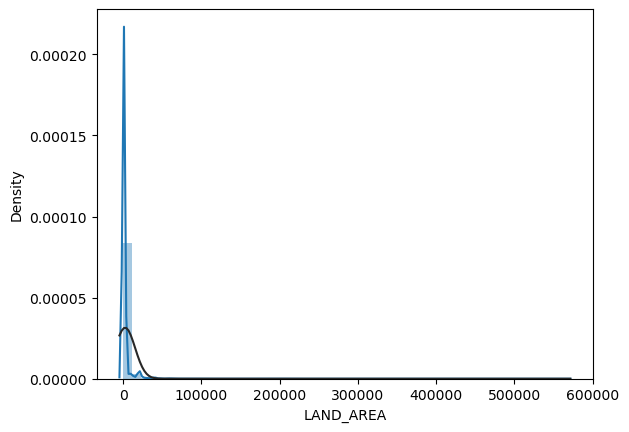

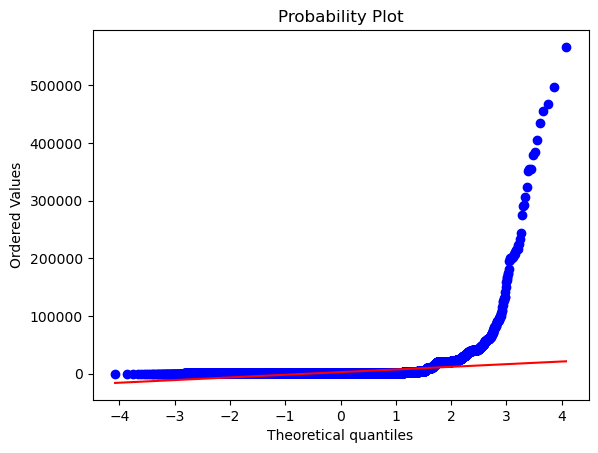

In [27]:
#histogram and normal probability plot
sns.distplot(df1['LAND_AREA'], fit=norm);
#plt.xlim(0, 5)
fig = plt.figure()
res = stats.probplot(df1['LAND_AREA'], plot=plt)

In [28]:
df1['LAND_AREA'].describe()

count     30497.000000
mean       2536.537987
std       12664.087659
min          61.000000
25%         505.000000
50%         683.000000
75%         835.000000
max      566786.000000
Name: LAND_AREA, dtype: float64

/var/folders/g2/pf8chq_93fv3k45nyqlc096r0000gn/T/ipykernel_1926/2051389038.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['LAND_AREA_log'] = np.log(df1['LAND_AREA'])
/var/folders/g2/pf8chq_93fv3k45nyqlc096r0000gn/T/ipykernel_1926/2051389038.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df1['LAND_AREA_log'], fit=norm);


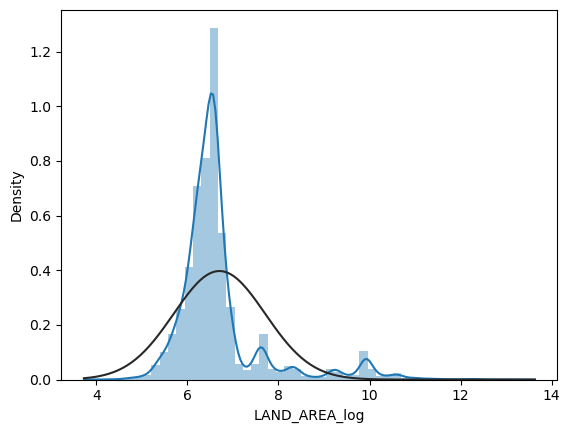

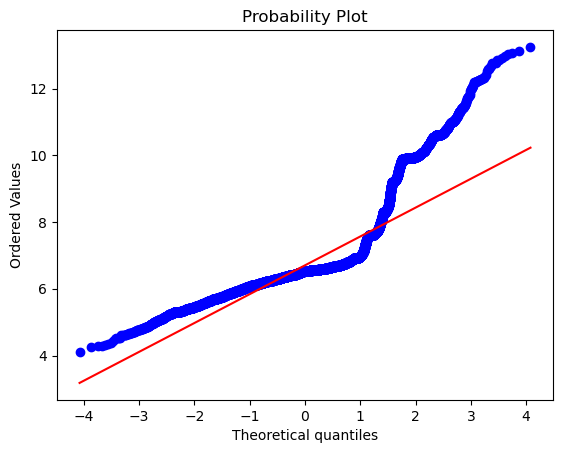

In [29]:
df1['LAND_AREA_log'] = np.log(df1['LAND_AREA'])
#histogram and normal probability plot
sns.distplot(df1['LAND_AREA_log'], fit=norm);
#plt.xlim(0, 5)
fig = plt.figure()
res = stats.probplot(df1['LAND_AREA_log'], plot=plt)

In [30]:
df2 = df1
df2.describe()

,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,LATITUDE,LONGITUDE,PRICE_log,BUILD_YEAR_log,FLOOR_AREA_log,LAND_AREA_log
count,3.049700e+04,30497.000000,30497.000000,30497.000000,30497.000000,30497.000000,30497.000000,30497.000000,30497.000000,30497.000000,30497.000000,30497.000000,30497.000000
mean,6.386433e+05,3.658753,1.821458,2.034790,2536.537987,183.340886,1989.703086,-31.959907,115.878803,13.235880,7.595685,5.139931,6.703905
std,3.572365e+05,0.749817,0.590033,1.441816,12664.087659,71.995797,20.963663,0.176396,0.117596,0.508192,0.010616,0.379216,1.004507
min,5.200000e+04,1.000000,1.000000,0.000000,61.000000,1.000000,1868.000000,-32.472979,115.583610,10.858999,7.532624,0.000000,4.110874
25%,4.100000e+05,3.000000,1.000000,2.000000,505.000000,130.000000,1978.000000,-32.066130,115.789340,12.923912,7.589842,4.867534,6.224558
50%,5.390000e+05,4.000000,2.000000,2.000000,683.000000,172.000000,1995.000000,-31.931770,115.853600,13.197471,7.598399,5.147494,6.526495
75%,7.650000e+05,4.000000,2.000000,2.000000,835.000000,223.000000,2005.000000,-31.843510,115.969994,13.547631,7.603399,5.407172,6.727432
max,2.440000e+06,10.000000,16.000000,99.000000,566786.000000,849.000000,2017.000000,-31.465818,116.341780,14.707509,7.609367,6.744059,13.247737


In [31]:
df2[df2['GARAGE'] > 40]

,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,NEAREST_STN,LATITUDE,LONGITUDE,NEAREST_SCH,PRICE_log,BUILD_YEAR_log,FLOOR_AREA_log,LAND_AREA_log
17286,Merriwa,375000,3,2,99.0,2916,126,2006.0,Butler Station,-31.665451,115.714965,ALKIMOS BAPTIST COLLEGE,12.834681,7.603898,4.836282,7.977968
30286,Banjup,1180000,3,2,50.0,22367,257,1990.0,Cockburn Central Station,-32.152920,115.896310,ATWELL COLLEGE,13.981025,7.595890,5.549076,10.015342


In [32]:
df2 = df2[~(df2['GARAGE'] > 50)]

In [33]:
df2['BEDROOMS'].unique()

array([ 4,  3,  2,  5,  6,  7,  1,  8, 10,  9])

In [34]:
df2['BATHROOMS'].unique()

array([ 2,  1,  3,  4,  5,  6,  7, 16])

In [35]:
df2[df2['BATHROOMS'] > 8]

,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,NEAREST_STN,LATITUDE,LONGITUDE,NEAREST_SCH,PRICE_log,BUILD_YEAR_log,FLOOR_AREA_log,LAND_AREA_log
28425,Lockridge,300000,4,16,1.0,745,95,1977.0,Success Hill Station,-31.87802,115.95117,KIARA COLLEGE,12.611538,7.589336,4.553877,6.613384


In [36]:
df2 = df2[~(df2['BATHROOMS'] > 8)]

# Feature engineering 

In [37]:
# creating new feature to help for outliers detection

In [39]:
df2['price_per_sqm'] = df2['PRICE']/df2['FLOOR_AREA']
df2

,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,NEAREST_STN,LATITUDE,LONGITUDE,NEAREST_SCH,PRICE_log,BUILD_YEAR_log,FLOOR_AREA_log,LAND_AREA_log,price_per_sqm
0,South Lake,565000,4,2,2.0,600,160,2003.0,Cockburn Central Station,-32.115900,115.842450,LAKELAND SENIOR HIGH SCHOOL,13.244581,7.602401,5.075174,6.396930,3531.250000
1,Wandi,365000,3,2,2.0,351,139,2013.0,Kwinana Station,-32.193470,115.859554,ATWELL COLLEGE,12.807653,7.607381,4.934474,5.860786,2625.899281
2,Camillo,287000,3,1,1.0,719,86,1979.0,Challis Station,-32.120578,115.993579,KELMSCOTT SENIOR HIGH SCHOOL,12.567237,7.590347,4.454347,6.577861,3337.209302
3,Bellevue,255000,2,1,2.0,651,59,1953.0,Midland Station,-31.900547,116.038009,SWAN VIEW SENIOR HIGH SCHOOL,12.449019,7.577122,4.077537,6.478510,4322.033898
4,Lockridge,325000,4,1,2.0,466,131,1998.0,Bassendean Station,-31.885790,115.947780,KIARA COLLEGE,12.691580,7.599902,4.875197,6.144186,2480.916031
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33648,Aubin Grove,423000,3,2,2.0,248,108,2011.0,Cockburn Central Station,-32.176013,115.858357,ATWELL COLLEGE,12.955127,7.606387,4.682131,5.513429,3916.666667
33649,Middle Swan,467000,4,2,2.0,400,132,2014.0,Midland Station,-31.872192,116.013543,LA SALLE COLLEGE,13.054085,7.607878,4.882802,5.991465,3537.878788
33650,South Fremantle,955000,3,2,1.0,200,127,1997.0,Fremantle Station,-32.066410,115.756070,FREMANTLE COLLEGE,13.769467,7.599401,4.844187,5.298317,7519.685039
33651,South Fremantle,1040000,4,3,2.0,292,245,2013.0,Fremantle Station,-32.064580,115.751820,CHRISTIAN BROTHERS' COLLEGE,13.854731,7.607381,5.501258,5.676754,4244.897959


In [40]:
len(df2.SUBURB.unique()) # Dimentionality is okay

319

In [38]:
df2['price_per_sqm_log'] = df2['PRICE_log']/df2['FLOOR_AREA_log']

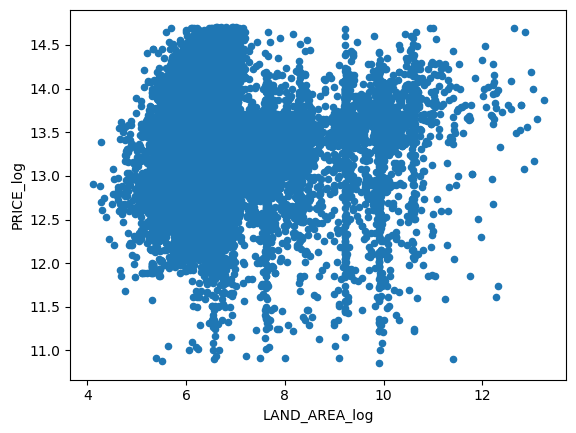

In [39]:
#bivariate analysis saleprice/grlivarea
var = 'LAND_AREA_log'
data = pd.concat([df2['PRICE_log'], df2[var]], axis=1)
data.plot.scatter(x=var, y='PRICE_log');

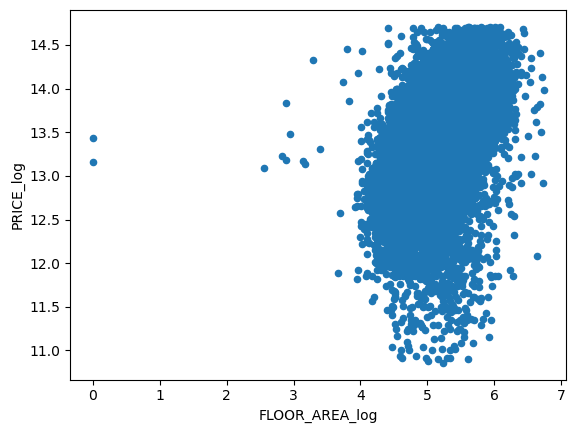

In [40]:
#bivariate analysis saleprice/grlivarea
var = 'FLOOR_AREA_log'
data = pd.concat([df2['PRICE_log'], df2[var]], axis=1)
data.plot.scatter(x=var, y='PRICE_log');

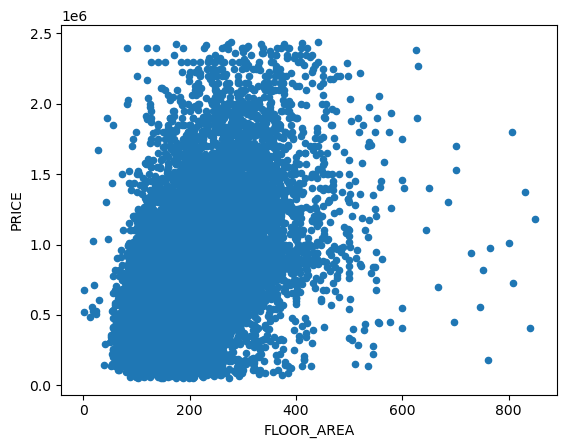

In [41]:
#bivariate analysis saleprice/grlivarea
var = 'FLOOR_AREA'
data = pd.concat([df1['PRICE'], df1[var]], axis=1)
data.plot.scatter(x=var, y='PRICE');

In [42]:
df2.price_per_sqm.describe()

AttributeError: 'DataFrame' object has no attribute 'price_per_sqm'

In [43]:
df2[df2['SUBURB']== 'Naval Base']

,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,NEAREST_STN,LATITUDE,LONGITUDE,NEAREST_SCH,PRICE_log,BUILD_YEAR_log,FLOOR_AREA_log,LAND_AREA_log,price_per_sqm_log
26079,Naval Base,1408000,3,1,0.0,2614,558,2002.0,Kwinana Station,-32.20141,115.78739,GILMORE COLLEGE,14.157681,7.601902,6.324359,7.868637,2.238595


In [44]:
df2 = df2[df2.groupby(['SUBURB'])['SUBURB'].transform('count') > 6]

In [45]:
df2

,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,NEAREST_STN,LATITUDE,LONGITUDE,NEAREST_SCH,PRICE_log,BUILD_YEAR_log,FLOOR_AREA_log,LAND_AREA_log,price_per_sqm_log
0,South Lake,565000,4,2,2.0,600,160,2003.0,Cockburn Central Station,-32.115900,115.842450,LAKELAND SENIOR HIGH SCHOOL,13.244581,7.602401,5.075174,6.396930,2.609680
1,Wandi,365000,3,2,2.0,351,139,2013.0,Kwinana Station,-32.193470,115.859554,ATWELL COLLEGE,12.807653,7.607381,4.934474,5.860786,2.595546
2,Camillo,287000,3,1,1.0,719,86,1979.0,Challis Station,-32.120578,115.993579,KELMSCOTT SENIOR HIGH SCHOOL,12.567237,7.590347,4.454347,6.577861,2.821342
3,Bellevue,255000,2,1,2.0,651,59,1953.0,Midland Station,-31.900547,116.038009,SWAN VIEW SENIOR HIGH SCHOOL,12.449019,7.577122,4.077537,6.478510,3.053073
4,Lockridge,325000,4,1,2.0,466,131,1998.0,Bassendean Station,-31.885790,115.947780,KIARA COLLEGE,12.691580,7.599902,4.875197,6.144186,2.603296
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33648,Aubin Grove,423000,3,2,2.0,248,108,2011.0,Cockburn Central Station,-32.176013,115.858357,ATWELL COLLEGE,12.955127,7.606387,4.682131,5.513429,2.766930
33649,Middle Swan,467000,4,2,2.0,400,132,2014.0,Midland Station,-31.872192,116.013543,LA SALLE COLLEGE,13.054085,7.607878,4.882802,5.991465,2.673482
33650,South Fremantle,955000,3,2,1.0,200,127,1997.0,Fremantle Station,-32.066410,115.756070,FREMANTLE COLLEGE,13.769467,7.599401,4.844187,5.298317,2.842472
33651,South Fremantle,1040000,4,3,2.0,292,245,2013.0,Fremantle Station,-32.064580,115.751820,CHRISTIAN BROTHERS' COLLEGE,13.854731,7.607381,5.501258,5.676754,2.518466


In [46]:
# We can notice strange values for both the min and the max
# These Price per sqm does not look realistic

In [47]:
meam = np.mean(df2.price_per_sqm_log)
st = np.std(df2.price_per_sqm_log)
print(meam, st)

inf nan


In [48]:
df2['price_per_sqm_log']

0        2.609680
1        2.595546
2        2.821342
3        3.053073
4        2.603296
           ...   
33648    2.766930
33649    2.673482
33650    2.842472
33651    2.518466
33654    2.834958
Name: price_per_sqm_log, Length: 30484, dtype: float64

In [ ]:
reduced_df = df2[(df2.price_per_sqm_log>(meam-st)) & (df2.price_per_sqm_log<=(meam+st))]

In [49]:
def outliers_remover(df):
    df_ = pd.DataFrame()
    for key, Suburb in df.groupby('SUBURB'):
        meam = np.mean(Suburb.price_per_sqm_log)
        st = np.std(Suburb.price_per_sqm_log)
        reduced_df = Suburb[(Suburb.price_per_sqm_log>(meam-st)) & (Suburb.price_per_sqm_log<=(meam+st))]
        df_ = pd.concat([df_,reduced_df],ignore_index=True)
    return df_
df3 = outliers_remover(df2)
df3.shape

(21461, 17)

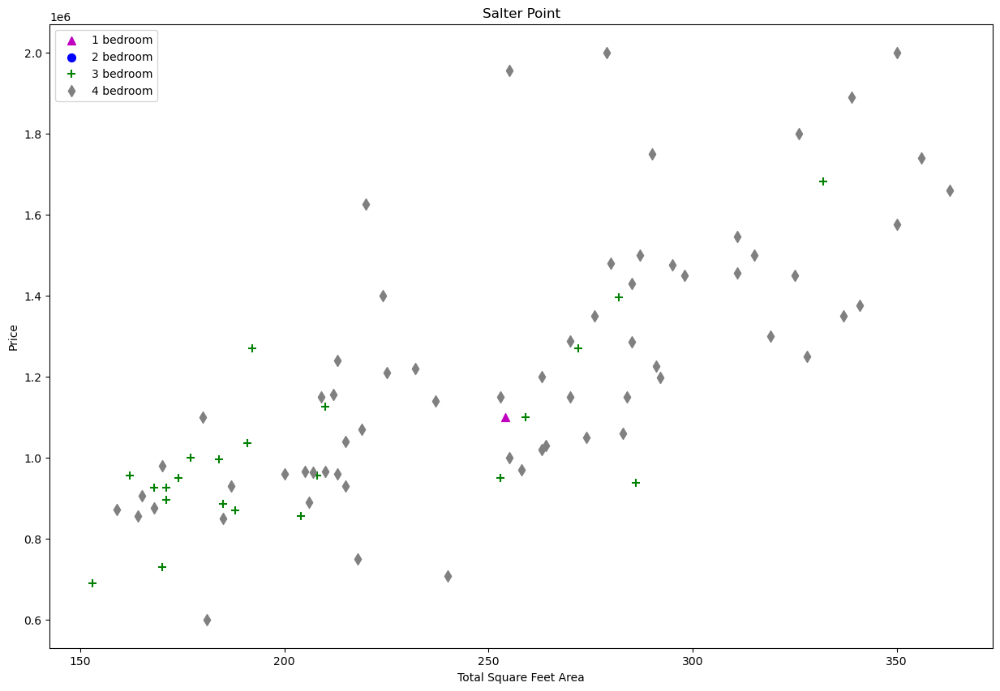

In [50]:
from matplotlib import pyplot as plt
%matplotlib inline
import matplotlib 
matplotlib.rcParams["figure.figsize"] = (20,10)

def plot_scatter_chart(df,Suburb):
    bed1 = df[(df.SUBURB==Suburb) & (df.BEDROOMS==1)]
    bed2 = df[(df.SUBURB==Suburb) & (df.BEDROOMS==2)]
    bed3 = df[(df.SUBURB==Suburb) & (df.BEDROOMS==3)]
    bed4 = df[(df.SUBURB==Suburb) & (df.BEDROOMS==4)]
    matplotlib.rcParams['figure.figsize'] = (15,10)
    plt.scatter(bed1.FLOOR_AREA,bed1.PRICE,marker= "^", color='m',label='1 bedroom', s=50)
    plt.scatter(bed2.FLOOR_AREA,bed2.PRICE,color='blue',label='2 bedroom', s=50)
    plt.scatter(bed3.FLOOR_AREA,bed3.PRICE,marker='+', color='green',label='3 bedroom', s=50)
    plt.scatter(bed4.FLOOR_AREA,bed4.PRICE,marker="d", color='gray',label='4 bedroom', s=50)
    plt.xlabel("Total Square Feet Area")
    plt.ylabel("Price")
    plt.title(Suburb)
    
    plt.legend()
    
plot_scatter_chart(df3,"Salter Point")

In [51]:
df3.SUBURB.unique()

array(['Alexander Heights', 'Alfred Cove', 'Alkimos', 'Anketell',
       'Applecross', 'Ardross', 'Armadale', 'Ascot', 'Ashby', 'Ashfield',
       'Attadale', 'Atwell', 'Aubin Grove', 'Aveley', 'Balcatta',
       'Baldivis', 'Balga', 'Ballajura', 'Banjup', 'Banksia Grove',
       'Baskerville', 'Bassendean', 'Bateman', 'Bayswater',
       'Beaconsfield', 'Beckenham', 'Bedford', 'Bedfordale', 'Beechboro',
       'Beeliar', 'Beldon', 'Belhus', 'Bellevue', 'Belmont',
       'Bennett Springs', 'Bentley', 'Bertram', 'Bickley', 'Bicton',
       'Booragoon', 'Boya', 'Brabham', 'Brentwood', 'Brigadoon',
       'Brookdale', 'Bull Creek', 'Bullsbrook', 'Burns Beach', 'Burswood',
       'Butler', 'Byford', 'Calista', 'Camillo', 'Canning Vale',
       'Cannington', 'Carabooda', 'Cardup', 'Carine', 'Carlisle',
       'Carmel', 'Carramar', 'Casuarina', 'Caversham', 'Champion Lakes',
       'Chidlow', 'Churchlands', 'City Beach', 'Claremont', 'Clarkson',
       'Cloverdale', 'Cockburn Central', 'Como

In [52]:
sns.pairplot(df3[['PRICE' , 'BEDROOMS', 'BATHROOMS', 'GARAGE', 'LAND_AREA', 'FLOOR_AREA', 'BUILD_YEAR', "price_per_sqm"]])

KeyError: "['price_per_sqm'] not in index"

In [53]:
import matplotlib
matplotlib.rcParams["figure.figsize"] = (20,10)
plt.hist(df3.price_per_sqm,rwidth=0.8)
plt.xlabel("Price Per")
plt.ylabel("Count")

AttributeError: 'DataFrame' object has no attribute 'price_per_sqm'

In [ ]:
plt.hist(df3.BATHROOMS,rwidth=0.8)
plt.xlabel("Number of bathrooms")
plt.ylabel("Count")

In [ ]:
df3[df3.BATHROOMS>df3.BEDROOMS]

In [48]:
df2

,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,NEAREST_STN,LATITUDE,LONGITUDE,NEAREST_SCH,PRICE_log,BUILD_YEAR_log,FLOOR_AREA_log,LAND_AREA_log,price_per_sqm,price_per_sqm_log
0,South Lake,565000,4,2,2.0,600,160,2003.0,Cockburn Central Station,-32.115900,115.842450,LAKELAND SENIOR HIGH SCHOOL,13.244581,7.602401,5.075174,6.396930,3531.250000,2.609680
1,Wandi,365000,3,2,2.0,351,139,2013.0,Kwinana Station,-32.193470,115.859554,ATWELL COLLEGE,12.807653,7.607381,4.934474,5.860786,2625.899281,2.595546
2,Camillo,287000,3,1,1.0,719,86,1979.0,Challis Station,-32.120578,115.993579,KELMSCOTT SENIOR HIGH SCHOOL,12.567237,7.590347,4.454347,6.577861,3337.209302,2.821342
3,Bellevue,255000,2,1,2.0,651,59,1953.0,Midland Station,-31.900547,116.038009,SWAN VIEW SENIOR HIGH SCHOOL,12.449019,7.577122,4.077537,6.478510,4322.033898,3.053073
4,Lockridge,325000,4,1,2.0,466,131,1998.0,Bassendean Station,-31.885790,115.947780,KIARA COLLEGE,12.691580,7.599902,4.875197,6.144186,2480.916031,2.603296
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33648,Aubin Grove,423000,3,2,2.0,248,108,2011.0,Cockburn Central Station,-32.176013,115.858357,ATWELL COLLEGE,12.955127,7.606387,4.682131,5.513429,3916.666667,2.766930
33649,Middle Swan,467000,4,2,2.0,400,132,2014.0,Midland Station,-31.872192,116.013543,LA SALLE COLLEGE,13.054085,7.607878,4.882802,5.991465,3537.878788,2.673482
33650,South Fremantle,955000,3,2,1.0,200,127,1997.0,Fremantle Station,-32.066410,115.756070,FREMANTLE COLLEGE,13.769467,7.599401,4.844187,5.298317,7519.685039,2.842472
33651,South Fremantle,1040000,4,3,2.0,292,245,2013.0,Fremantle Station,-32.064580,115.751820,CHRISTIAN BROTHERS' COLLEGE,13.854731,7.607381,5.501258,5.676754,4244.897959,2.518466


In [55]:
df4 = df3.drop([ 'PRICE', 'BUILD_YEAR', 'NEAREST_STN', 'NEAREST_SCH', 
                'LAND_AREA', 'FLOOR_AREA', 'PRICE', 'price_per_sqm_log', 'LATITUDE', 'LONGITUDE'],axis='columns')

In [56]:
df4

,SUBURB,BEDROOMS,BATHROOMS,GARAGE,PRICE_log,BUILD_YEAR_log,FLOOR_AREA_log,LAND_AREA_log
0,Alexander Heights,3,2,4.0,13.180632,7.593374,5.298317,6.647688
1,Alexander Heights,4,2,2.0,12.971540,7.601402,5.036953,6.335054
2,Alexander Heights,4,2,2.0,12.994530,7.597396,4.948760,6.378426
3,Alexander Heights,4,2,2.0,13.083623,7.598900,5.153292,6.418365
4,Alexander Heights,4,2,2.0,12.936034,7.596392,4.934474,6.553933
...,...,...,...,...,...,...,...,...
21456,Yokine,3,2,2.0,13.396960,7.601902,5.099866,6.950815
21457,Yokine,3,1,0.0,13.617060,7.578657,5.337538,6.699500
21458,Yokine,3,2,0.0,13.487006,7.604894,5.252273,6.079933
21459,Yokine,3,2,2.0,13.279367,7.580700,4.875197,6.695799


In [57]:
dummies = pd.get_dummies(df4['SUBURB'])
df4 = pd.concat([df4,dummies],axis='columns')
#dummies = pd.get_dummies(df4['NEAREST_STN'])
#df4 = pd.concat([df4,dummies],axis='columns')
#dummies = pd.get_dummies(df4['NEAREST_SCH'])
#df4 = pd.concat([df4,dummies],axis='columns')
df4 = df4.drop(['SUBURB'],axis='columns')
df4.head()

,BEDROOMS,BATHROOMS,GARAGE,PRICE_log,BUILD_YEAR_log,FLOOR_AREA_log,LAND_AREA_log,Alexander Heights,Alfred Cove,Alkimos,...,Wilson,Winthrop,Woodbridge,Woodlands,Woodvale,Wooroloo,Wungong,Yanchep,Yangebup,Yokine
0,3,2,4.0,13.180632,7.593374,5.298317,6.647688,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,4,2,2.0,12.971540,7.601402,5.036953,6.335054,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,4,2,2.0,12.994530,7.597396,4.948760,6.378426,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,2,2.0,13.083623,7.598900,5.153292,6.418365,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,4,2,2.0,12.936034,7.596392,4.934474,6.553933,1,0,0,...,0,0,0,0,0,0,0,0,0,0


In [52]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df4_ = df4[['PRICE_log', 'BEDROOMS', 'BATHROOMS', 'GARAGE', 'BUILD_YEAR_log', 'FLOOR_AREA_log', 'LAND_AREA_log']]
data_fit = scaler.fit_transform(df4_)
df4_fit = pd.DataFrame(data_fit, index=df4_.index, columns=df4_.columns)
df4_fit

,PRICE_log,BEDROOMS,BATHROOMS,GARAGE,BUILD_YEAR_log,FLOOR_AREA_log,LAND_AREA_log
0,0.016955,0.454928,0.306085,-0.024087,0.632602,-0.170710,-0.305053
1,-0.843101,-0.878793,0.306085,-0.024087,1.101685,-0.541881,-0.839499
2,-1.316337,-0.878793,-1.405026,-0.775642,-0.502819,-1.808472,-0.124694
3,-1.549041,-2.212514,-1.405026,-0.024087,-1.748504,-2.802509,-0.223731
4,-1.071579,0.454928,-1.405026,-0.024087,0.397182,-0.698255,-0.556997
...,...,...,...,...,...,...,...
33648,-0.552810,-0.878793,0.306085,-0.024087,1.008055,-1.207570,-1.185756
33649,-0.358021,0.454928,0.306085,-0.024087,1.148465,-0.678194,-0.709234
33650,1.050147,-0.878793,0.306085,-0.775642,0.350027,-0.780061,-1.400187
33651,1.217983,0.454928,2.017195,-0.024087,1.101685,0.953315,-1.022949


In [53]:
df5 = pd.concat([df4_fit,df4.iloc[: , 7:]],axis='columns')
df5

,PRICE_log,BEDROOMS,BATHROOMS,GARAGE,BUILD_YEAR_log,FLOOR_AREA_log,LAND_AREA_log,Alexander Heights,Alfred Cove,Alkimos,...,Wilson,Winthrop,Woodbridge,Woodlands,Woodvale,Wooroloo,Wungong,Yanchep,Yangebup,Yokine
0,0.016955,0.454928,0.306085,-0.024087,0.632602,-0.170710,-0.305053,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,-0.843101,-0.878793,0.306085,-0.024087,1.101685,-0.541881,-0.839499,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,-1.316337,-0.878793,-1.405026,-0.775642,-0.502819,-1.808472,-0.124694,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,-1.549041,-2.212514,-1.405026,-0.024087,-1.748504,-2.802509,-0.223731,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,-1.071579,0.454928,-1.405026,-0.024087,0.397182,-0.698255,-0.556997,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33648,-0.552810,-0.878793,0.306085,-0.024087,1.008055,-1.207570,-1.185756,0,0,0,...,0,0,0,0,0,0,0,0,0,0
33649,-0.358021,0.454928,0.306085,-0.024087,1.148465,-0.678194,-0.709234,0,0,0,...,0,0,0,0,0,0,0,0,0,0
33650,1.050147,-0.878793,0.306085,-0.775642,0.350027,-0.780061,-1.400187,0,0,0,...,0,0,0,0,0,0,0,0,0,0
33651,1.217983,0.454928,2.017195,-0.024087,1.101685,0.953315,-1.022949,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [58]:
X = df4.drop(['PRICE_log'],axis='columns')
X.head()

,BEDROOMS,BATHROOMS,GARAGE,BUILD_YEAR_log,FLOOR_AREA_log,LAND_AREA_log,Alexander Heights,Alfred Cove,Alkimos,Anketell,...,Wilson,Winthrop,Woodbridge,Woodlands,Woodvale,Wooroloo,Wungong,Yanchep,Yangebup,Yokine
0,3,2,4.0,7.593374,5.298317,6.647688,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,4,2,2.0,7.601402,5.036953,6.335054,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,4,2,2.0,7.597396,4.948760,6.378426,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,2,2.0,7.598900,5.153292,6.418365,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,4,2,2.0,7.596392,4.934474,6.553933,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [59]:
y = df4.PRICE_log
len(y)

21461

In [60]:
from urllib.request import urlopen
import json
import plotly.express as px

In [61]:
#from urllib.request import urlopen
#import json

with urlopen('https://raw.githubusercontent.com/tonywr71/GeoJson-Data/master/australian-states.json') as response:
    australia = json.load(response)

info = geo_df = df2[['LATITUDE', 'LONGITUDE', 'PRICE', 'SUBURB', 'BUILD_YEAR']]

fig = px.scatter_mapbox(info, lat='LATITUDE', lon='LONGITUDE', hover_name='SUBURB', 
    hover_data=['BUILD_YEAR'], color='PRICE',
    zoom=8, height=500, width=1150)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":1,"l":1,"b":1})
fig.show()

In [62]:
from sklearn import metrics
from sklearn.model_selection import cross_val_score

def cross_val(model):
    pred = cross_val_score(model, X, y, cv=10)
    return pred.mean()

def print_evaluate(true, predicted):  
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    print('MAE:', mae)
    print('MSE:', mse)
    print('RMSE:', rmse)
    print('R2 Square', r2_square)
    print('__________________________________')
    
def evaluate(true, predicted):
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    return mae, mse, rmse, r2_square

In [64]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [65]:
from sklearn.linear_model import LinearRegression

In [66]:
lin_reg = LinearRegression(normalize=False)
lin_reg.fit(X_train,y_train)

/Users/edgarsicat/miniforge3/envs/native/lib/python3.9/site-packages/sklearn/linear_model/_base.py:148: FutureWarning:

'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed please use sklearn.preprocessing.StandardScaler instead.



LinearRegression(normalize=False)

In [67]:
# print the intercept
print(lin_reg.intercept_)

21.41724603065786


In [69]:
coeff_df = pd.DataFrame(lin_reg.coef_, X.columns, columns=['Coefficient'])
coeff_df.sort_values(by='Coefficient', ascending=False).head(10)

,Coefficient
Cottesloe,1.028336
Peppermint Grove,0.868190
Dalkeith,0.852316
Shenton Park,0.831976
FLOOR_AREA_log,0.793203
Claremont,0.791456
Nedlands,0.787400
Subiaco,0.771713
Swanbourne,0.764244
West Leederville,0.754560


In [70]:
pred = lin_reg.predict(X_test)

In [71]:
pd.DataFrame({'True Values': y_test, 'Predicted Values': pred}).hvplot.scatter(x='True Values', y='Predicted Values')


:Scatter   [True Values]   (Predicted Values)

In [72]:
pd.DataFrame({'Error Values': (y_test - pred)}).hvplot.kde()

:Distribution   [Error Values]   (Density)

In [73]:
test_pred = lin_reg.predict(X_test)
train_pred = lin_reg.predict(X_train)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

results_df = pd.DataFrame(data=[["Linear Regression", *evaluate(y_test, test_pred) , cross_val(LinearRegression())]], 
                          columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', "Cross Validation"])

Test set evaluation:
_____________________________________
MAE: 0.12923035445517922
MSE: 0.033913480993982434
RMSE: 0.184156132110724
R2 Square 0.8510541049178502
__________________________________
Train set evaluation:
_____________________________________
MAE: 0.12825835512370762
MSE: 0.03397001362675845
RMSE: 0.1843095592386853
R2 Square 0.8555804670473205
__________________________________


In [91]:
from sklearn.linear_model import Ridge

model = Ridge(alpha=100, solver='cholesky', tol=0.0001, random_state=42)
model.fit(X_train, y_train)
pred = model.predict(X_test)

test_pred = model.predict(X_test)
train_pred = model.predict(X_train)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('====================================')
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

results_df_2 = pd.DataFrame(data=[["Ridge Regression", *evaluate(y_test, test_pred) , cross_val(Ridge())]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', "Cross Validation"])
results_df = results_df.append(results_df_2, ignore_index=True)

Test set evaluation:
_____________________________________
MAE: 0.22778167396048482
MSE: 0.10782122100701394
RMSE: 0.3283614182680632
R2 Square 0.5846094743427108
__________________________________
Train set evaluation:
_____________________________________
MAE: 0.2269522129251371
MSE: 0.10939965067372395
RMSE: 0.3307561800990632
R2 Square 0.5749599929615545
__________________________________


/var/folders/g2/pf8chq_93fv3k45nyqlc096r0000gn/T/ipykernel_20836/1501396925.py:18: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append(results_df_2, ignore_index=True)


In [92]:
from sklearn.linear_model import Lasso

model = Lasso(alpha=0.1, 
              precompute=True, 
#               warm_start=True, 
              positive=True, 
              selection='random',
              random_state=42)
model.fit(X_train, y_train)

test_pred = model.predict(X_test)
train_pred = model.predict(X_train)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('====================================')
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

results_df_2 = pd.DataFrame(data=[["Lasso Regression", *evaluate(y_test, test_pred) , cross_val(Lasso())]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', "Cross Validation"])
results_df = results_df.append(results_df_2, ignore_index=True)

Test set evaluation:
_____________________________________
MAE: 0.384522175502477
MSE: 0.24919105020843277
RMSE: 0.49919039474776833
R2 Square 0.03997005071534809
__________________________________
Train set evaluation:
_____________________________________
MAE: 0.3839861749627669
MSE: 0.24731500601771253
RMSE: 0.4973077578499179
R2 Square 0.03913064391777288
__________________________________


/var/folders/g2/pf8chq_93fv3k45nyqlc096r0000gn/T/ipykernel_20836/141553427.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append(results_df_2, ignore_index=True)


In [93]:
from sklearn.linear_model import ElasticNet

model = ElasticNet(alpha=0.1, l1_ratio=0.9, selection='random', random_state=42)
model.fit(X_train, y_train)

test_pred = model.predict(X_test)
train_pred = model.predict(X_train)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('====================================')
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

results_df_2 = pd.DataFrame(data=[["Elastic Net Regression", *evaluate(y_test, test_pred) , cross_val(ElasticNet())]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', "Cross Validation"])
results_df = results_df.append(results_df_2, ignore_index=True)

Test set evaluation:
_____________________________________
MAE: 0.37590827064269433
MSE: 0.23935144849160553
RMSE: 0.48923557566023906
R2 Square 0.07787796245329215
__________________________________
Train set evaluation:
_____________________________________
MAE: 0.37551529191207916
MSE: 0.23788511035957816
RMSE: 0.4877346720908594
R2 Square 0.07576771626875367
__________________________________


/var/folders/g2/pf8chq_93fv3k45nyqlc096r0000gn/T/ipykernel_20836/3194095555.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append(results_df_2, ignore_index=True)


In [94]:
from sklearn.linear_model import SGDRegressor

sgd_reg = SGDRegressor(n_iter_no_change=250, penalty=None, eta0=0.0001, max_iter=100000)
sgd_reg.fit(X_train, y_train)

test_pred = sgd_reg.predict(X_test)
train_pred = sgd_reg.predict(X_train)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)
print('====================================')
print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

results_df_2 = pd.DataFrame(data=[["Stochastic Gradient Descent", *evaluate(y_test, test_pred), 0]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', 'Cross Validation'])
results_df = results_df.append(results_df_2, ignore_index=True)

Test set evaluation:
_____________________________________
MAE: 0.30432125751330846
MSE: 0.16907521530593722
RMSE: 0.4111875670614777
R2 Square 0.34862319397232666
__________________________________
Train set evaluation:
_____________________________________
MAE: 0.30293914397259786
MSE: 0.17131006170256688
RMSE: 0.41389619677229084
R2 Square 0.33442538999528804
__________________________________


/var/folders/g2/pf8chq_93fv3k45nyqlc096r0000gn/T/ipykernel_20836/2238061219.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append(results_df_2, ignore_index=True)


In [96]:
from sklearn.ensemble import RandomForestRegressor

rf_reg = RandomForestRegressor(n_estimators=1000)
rf_reg.fit(X_train, y_train)

test_pred = rf_reg.predict(X_test)
train_pred = rf_reg.predict(X_train)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)

print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

results_df_2 = pd.DataFrame(data=[["Random Forest Regressor", *evaluate(y_test, test_pred), 0]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', 'Cross Validation'])
results_df = results_df.append(results_df_2, ignore_index=True)

Test set evaluation:
_____________________________________
MAE: 0.20406934565735127
MSE: 0.09485852884233645
RMSE: 0.30799111812248164
R2 Square 0.6345493605907875
__________________________________
Train set evaluation:
_____________________________________
MAE: 0.07569990016651362
MSE: 0.013278473292723745
RMSE: 0.1152322580388137
R2 Square 0.9484104167879699
__________________________________


/var/folders/g2/pf8chq_93fv3k45nyqlc096r0000gn/T/ipykernel_20836/1416346550.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append(results_df_2, ignore_index=True)


In [ ]:
from sklearn.svm import SVR

svm_reg = SVR(kernel='rbf', C=1000000, epsilon=0.001)
svm_reg.fit(X_train, y_train)

test_pred = svm_reg.predict(X_test)
train_pred = svm_reg.predict(X_train)

print('Test set evaluation:\n_____________________________________')
print_evaluate(y_test, test_pred)

print('Train set evaluation:\n_____________________________________')
print_evaluate(y_train, train_pred)

results_df_2 = pd.DataFrame(data=[["SVM Regressor", *evaluate(y_test, test_pred), 0]], 
                            columns=['Model', 'MAE', 'MSE', 'RMSE', 'R2 Square', 'Cross Validation'])
results_df = results_df.append(results_df_2, ignore_index=True)

<AxesSubplot: ylabel='Model'>

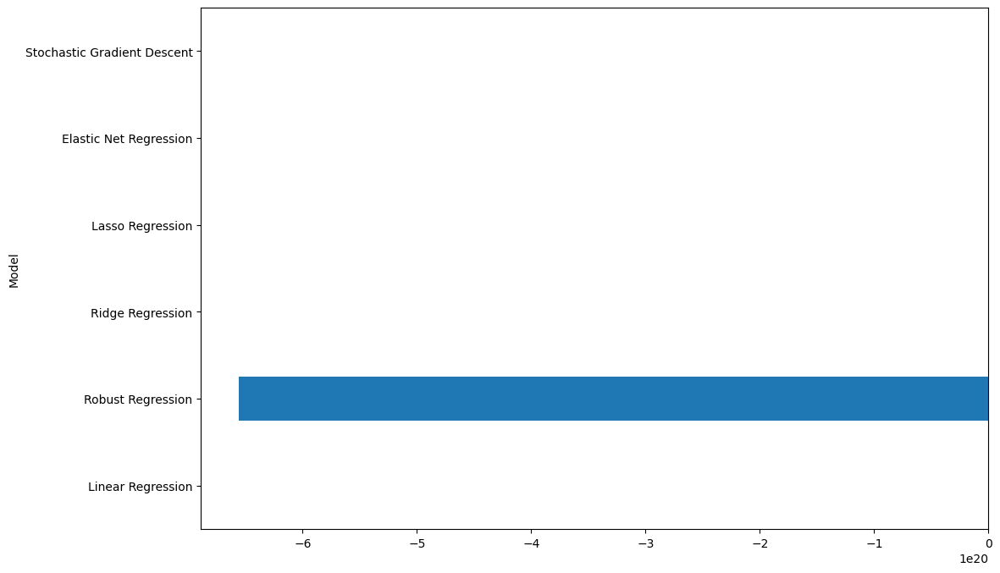

In [95]:
results_df.set_index('Model', inplace=True)
results_df['R2 Square'].plot(kind='barh', figsize=(12, 8))

In [86]:
def predict_price(BEDROOMS,BATHROOMS,GARAGE,BUILD_YEAR_log,FLOOR_AREA_log, LAND_AREA_log, SUBURB):    
    loc_index = np.where(X.columns==SUBURB)[0][0]

    x = np.zeros(len(X.columns))
    x[0] = BEDROOMS
    x[1] = BATHROOMS
    x[2] = GARAGE
    x[3] = np.log(BUILD_YEAR_log)
    x[4] = np.log(FLOOR_AREA_log)
    x[5] = np.log(LAND_AREA_log)
        
    if loc_index >= 0:
        x[loc_index] = 1

    return np.exp(lin_reg.predict([x])[0])

In [87]:
predict_price(3, 2, 2, 2002, 164, 1044, 'Yokine')

/Users/edgarsicat/miniforge3/envs/native/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names



558671.2853694798

In [84]:
df3

,SUBURB,PRICE,BEDROOMS,BATHROOMS,GARAGE,LAND_AREA,FLOOR_AREA,BUILD_YEAR,NEAREST_STN,LATITUDE,LONGITUDE,NEAREST_SCH,PRICE_log,BUILD_YEAR_log,FLOOR_AREA_log,LAND_AREA_log,price_per_sqm_log
0,Alexander Heights,530000,3,2,4.0,771,200,1985.0,Warwick Station,-31.831380,115.873810,MERCY COLLEGE,13.180632,7.593374,5.298317,6.647688,2.487702
1,Alexander Heights,430000,4,2,2.0,564,154,2001.0,Warwick Station,-31.825440,115.856040,GIRRAWHEEN SENIOR HIGH SCHOOL,12.971540,7.601402,5.036953,6.335054,2.575275
2,Alexander Heights,440000,4,2,2.0,589,141,1993.0,Warwick Station,-31.834520,115.856680,GIRRAWHEEN SENIOR HIGH SCHOOL,12.994530,7.597396,4.948760,6.378426,2.625815
3,Alexander Heights,481000,4,2,2.0,613,173,1996.0,Greenwood Station,-31.822360,115.861380,LANDSDALE CHRISTIAN SCHOOL,13.083623,7.598900,5.153292,6.418365,2.538887
4,Alexander Heights,415000,4,2,2.0,702,139,1991.0,Warwick Station,-31.825460,115.869730,LANDSDALE CHRISTIAN SCHOOL,12.936034,7.596392,4.934474,6.553933,2.621563
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21456,Yokine,658000,3,2,2.0,1044,164,2002.0,Glendalough Station,-31.900910,115.855600,CARMEL SCHOOL,13.396960,7.601902,5.099866,6.950815,2.626924
21457,Yokine,820000,3,1,0.0,812,208,1956.0,Glendalough Station,-31.902802,115.844638,SERVITE COLLEGE,13.617060,7.578657,5.337538,6.699500,2.551187
21458,Yokine,720000,3,2,0.0,437,191,2008.0,Glendalough Station,-31.908113,115.854321,CARMEL SCHOOL,13.487006,7.604894,5.252273,6.079933,2.567842
21459,Yokine,585000,3,2,2.0,809,131,1960.0,Glendalough Station,-31.897399,115.850472,CARMEL SCHOOL,13.279367,7.580700,4.875197,6.695799,2.723862


In [88]:
predict_price(3, 2, 2, 2002, 164, 1044, 'Yokine')

/Users/edgarsicat/miniforge3/envs/native/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but LinearRegression was fitted with feature names



719151.0323973083

In [90]:
import pickle
with open('home_prices_model.pickle','wb') as f:
    pickle.dump(lin_reg,f)

In [92]:
import json
columns = {
    'data_columns' : [col.lower() for col in X.columns]
}
with open("columns.json","w") as f:
    f.write(json.dumps(columns))

In [91]:
X

,BEDROOMS,BATHROOMS,GARAGE,BUILD_YEAR_log,FLOOR_AREA_log,LAND_AREA_log,Alexander Heights,Alfred Cove,Alkimos,Anketell,...,Wilson,Winthrop,Woodbridge,Woodlands,Woodvale,Wooroloo,Wungong,Yanchep,Yangebup,Yokine
0,3,2,4.0,7.593374,5.298317,6.647688,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,4,2,2.0,7.601402,5.036953,6.335054,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,4,2,2.0,7.597396,4.948760,6.378426,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,2,2.0,7.598900,5.153292,6.418365,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,4,2,2.0,7.596392,4.934474,6.553933,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21456,3,2,2.0,7.601902,5.099866,6.950815,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
21457,3,1,0.0,7.578657,5.337538,6.699500,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
21458,3,2,0.0,7.604894,5.252273,6.079933,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
21459,3,2,2.0,7.580700,4.875197,6.695799,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
